# Importing Libraries

In [1]:
 #pip install plotly==4.14.3

In [1]:
#importing libraries 
import numpy as np
import pandas as pd 
from sklearn import preprocessing
import statsmodels.api as sm
import matplotlib.pyplot as plt
plt.rc("font", size=14)
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore')
import re
import seaborn as sns
import string
import nltk
import warnings 
warnings.filterwarnings("ignore", category=DeprecationWarning)
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px

In [32]:
#reading the data
data = pd.read_excel('Data.xlsx')

In [31]:
#converting object to float
data['invoice_amt'] = pd.to_numeric(data['invoice_amt'], errors='coerce')

In [32]:
data.shape

(177698, 15)

In [33]:
data.isna().sum()

data_source           0   
date                  0   
customer_contactno    0   
customer_name         5   
store_code            0   
invoice_date          0   
invoice_no            0   
invoice_amt           2   
brand_name            3006
product_id            1   
product_name          0   
class_desc            0   
category_desc         0   
ratings               0   
comments              1010
dtype: int64

In [37]:
#removing records with missing comments 
combined_df = data[data['comments'].notnull()]

# Data preprocessing and Cleaning 

#### (A) Removing Punctuations, Numbers, and Special Characters

In [39]:
# remove special characters, numbers, punctuations
combined_df['comments_removing_pnc'] = combined_df['comments'].str.replace("[^a-zA-Z#]", " ")

#### (B) Removing Short Words

In [40]:
combined_df['comments_removing_shortwords']= combined_df['comments_removing_pnc'].astype(str)

In [42]:
#removed words with length <3
combined_df['comments_removing_shortwords'] = combined_df['comments_removing_shortwords'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

#### (C) Tokenisation
Tokenization is the process breaking complex data like paragraphs into simple units called tokens.
Sentence tokenization : split a paragraph into list of sentences using sent_tokenize() method
Word tokenization : split a sentence into list of words using word_tokenize() method

In [43]:
def tokenize(txt):
    tokens = re.split('\W+', txt)
    return tokens 

combined_df['comments_clean_tokenized'] = combined_df['comments_removing_shortwords'].apply(lambda x: tokenize(x.lower()))

In [44]:
combined_df.comments_clean_tokenized

0         [because, happy, with, people, when, came, over, there, very, happy, with, have, time, this, this, feedback, have, given, communication, please, just, told, reason, have, given, feedback, your, problem, deal, with, this, when, walked, store, this, there, nobody, attended, fine, thing, self, then, later, when, told, them, there, many, people, standing, wasting, there, time, then, everybody, started, running, around, after, that, this, feedback, want, further, calls, that, will, disturber, whatever, have, have]
1         [good, over, there, service, little, late, other, thing, good]                                                                                                                                                                                                                                                                                                                                                                                                                   

#### (D) Removing Stopwords

In [45]:
#pip install stop-words

In [46]:
from stop_words import get_stop_words              
stop_words = get_stop_words('en')
stop_words = get_stop_words('english')
from nltk.tokenize import word_tokenize
stop_words.append('croma')

In [47]:
def remove_stopwords(tokenized_txt):
    txt_clean = [word for word in tokenized_txt if word not in stop_words]
    return txt_clean

combined_df['comments_no_sw'] = combined_df['comments_clean_tokenized'].apply(lambda x: remove_stopwords(x))

#### (E) Lemmatisation
Lemmatisation is the process of reducing the number of words into a single word by combining common words together. It is the process of transforming to the dictionary base form.

In [57]:
wn = nltk.WordNetLemmatizer()

def lemmatization(token_txt):
    lemma_text = [wn.lemmatize(word) for word in token_txt]
    return lemma_text

combined_df['comments_lemmatized'] = combined_df['comments_no_sw'].apply(lambda x: lemmatization(x))


In [58]:
combined_df.head() 

,data_source,date,customer_contactno,customer_name,store_code,invoice_date,invoice_no,invoice_amt,brand_name,product_id,product_name,class_desc,category_desc,ratings,comments,comments_removing_pnc,comments_removing_shortwords,comments_clean_tokenized,comments_no_sw,comments_lemmatized
0,NPS - Store,2019-04-01,9822066109,SABNIS,A001,2019-03-30 00:00:00,SLA001010191262,26600.00,APPLE,209432,APPLE iPad WiFi 32GB 6th Gen SG,CMP-XT-020,Computers Peripherals,5,"because i was not happy with people when i had came over there. I am not very happy with . I don't have time for all this this feedback i have given any communication please. I just told you the reason why i have given you bad feedback its your problem to deal with this. When i was walked in to store i ask this. There was nobody attended to me , i had to fine thing on my own self and then later on when i told them there are so many people standing wasting there time then everybody started running around after that. This is my feedback i don't want any further calls that will disturber me . So whatever you have to do now you have to do it.",because i was not happy with people when i had came over there I am not very happy with I don t have time for all this this feedback i have given any communication please I just told you the reason why i have given you bad feedback its your problem to deal with this When i was walked in to store i ask this There was nobody attended to me i had to fine thing on my own self and then later on when i told them there are so many people standing wasting there time then everybody started running around after that This is my feedback i don t want any further calls that will disturber me So whatever you have to do now you have to do it,because happy with people when came over there very happy with have time this this feedback have given communication please just told reason have given feedback your problem deal with this When walked store this There nobody attended fine thing self then later when told them there many people standing wasting there time then everybody started running around after that This feedback want further calls that will disturber whatever have have,"[because, happy, with, people, when, came, over, there, very, happy, with, have, time, this, this, feedback, have, given, communication, please, just, told, reason, have, given, feedback, your, problem, deal, with, this, when, walked, store, this, there, nobody, attended, fine, thing, self, then, later, when, told, them, there, many, people, standing, wasting, there, time, then, everybody, started, running, around, after, that, this, feedback, want, further, calls, that, will, disturber, whatever, have, have]","[happy, people, came, happy, time, feedback, given, communication, please, just, told, reason, given, feedback, problem, deal, walked, store, nobody, attended, fine, thing, self, later, told, many, people, standing, wasting, time, everybody, started, running, around, feedback, want, calls, will, disturber, whatever]","[happy, people, came, happy, time, feedback, given, communication, please, just, told, reason, given, feedback, problem, deal, walked, store, nobody, attended, fine, thing, self, later, told, many, people, standing, wasting, time, everybody, started, running, around, feedback, want, call, will, disturber, whatever]"
1,NPS - Store,2019-04-01,7760619598,RAJESH .,A001,2019-03-30 00:00:00,SLA001010191284,7490.00,SAMSUNG,209425,SAMSUNG J2 2018 Black,COM-CB-020,Communication,7,"its good over there , service is little late other thing is good.",its good over there service is little late other thing is good,good over there service little late other thing good,"[good, over, there, service, little, late, other, thing, good]","[good, service, little, late, thing, good]","[good, service, little, late, thing, good]"
2,NPS - Store,2019-04-01,9321224172,Rajendra Mehta,A001,2019-03-30 00:00:00,SLA001010191300,87720.75,HP,211916,HP 20 AIO 20c419in PQC 4GBN,CMP-XD-010,Computers P

In [59]:
combined_df.to_csv('cleaned_data.csv', encoding = 'utf-8')

# Data Visualisation

In [60]:
cleaned_data = pd.read_csv('cleaned_data.csv')

In [63]:
cleaned_data_vis= cleaned_data['comments_lemmatized'].astype(str)

In [64]:
cleaned_data=cleaned_data.rename({'ratings ':'ratings'}, axis=1)

In [65]:
cleaned_data.loc[cleaned_data.ratings >= 9, "NPS"] = "Promoter"

In [66]:
cleaned_data.loc[(cleaned_data.ratings >= 7) & (cleaned_data.ratings <9), "NPS"] = "Passive"

In [67]:
cleaned_data.loc[cleaned_data.ratings < 7, "NPS"] = "Detractor"

In [68]:
#pip install wordcloud

In [69]:
textt = " ".join(review for review in cleaned_data_vis)


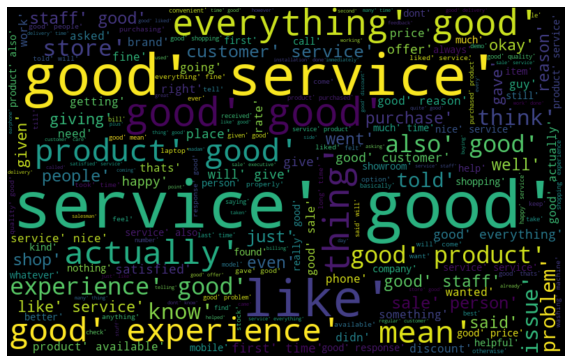

In [70]:
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(textt)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

# Sentiment Analysis 

#### (A) Polarity
Polarity is float which lies in the range of [-1,1] where 1 means positive statement and -1 means a negative statement. Figure 1 shows the distribution of polarity score in reviews. Most of the reviews are on positive side of the plot

In [122]:
from textblob import TextBlob

In [123]:
cleaned_data['comments_lemmatized'] = cleaned_data['comments_lemmatized'].astype(str) 

In [124]:
cleaned_data['polarity'] = cleaned_data['comments_lemmatized'].map(lambda text: TextBlob(text).sentiment.polarity)
cleaned_data['review_len'] = cleaned_data['comments_lemmatized'].astype(str).apply(len)
cleaned_data['word_count'] = cleaned_data['comments_lemmatized'].apply(lambda x: len(str(x).split()))

In [126]:
#cleaned_data = cleaned_data.drop(['Unnamed: 0'], axis=1)

In [127]:
cleaned_data.describe()

,invoice_amt,ratings,polarity,review_len,word_count
count,1.766860e+05,176688.000000,176688.000000,176688.000000,176688.000000
mean,2.256758e+04,8.742773,0.380801,76.133201,7.637395
std,2.782235e+04,1.775959,0.314305,108.929930,11.022543
min,0.000000e+00,0.000000,-1.000000,2.000000,1.000000
25%,3.318088e+03,8.000000,0.000000,23.000000,2.000000
50%,1.501580e+04,9.000000,0.433333,45.000000,5.000000
75%,3.283741e+04,10.000000,0.700000,85.000000,8.000000
max,1.153172e+06,10.000000,1.000000,4838.000000,499.000000


In [128]:
cl = cleaned_data.loc[cleaned_data.polarity == -1, ['comments']].sample(5).values
for c in cl:
    print(c[0])

till now i don't have any worst feedback with croma
Your is Billing is totally worst i have to  wait for  15 to 20 minutes to bill one product .
Actually i got  the worst experience from croma.
very worst experience
Your service is too worst. No one guided us I choose product myself.


In [129]:
import pandas as pd
pd.options.plotting.backend = "plotly"

In [130]:
#pip install plotly

In [131]:
#pip install cufflinks

In [132]:
#pip install chart_studio

In [133]:
import cufflinks as cf

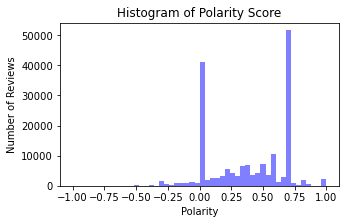

In [134]:
#Histogram of polarity distribution
num_bins = 50
plt.figure(figsize=(5,3))
n, bins, patches = plt.hist(cleaned_data.polarity, num_bins, facecolor='blue', alpha=0.5)
plt.xlabel('Polarity')
plt.ylabel('Number of Reviews')
plt.title('Histogram of Polarity Score')
plt.show();

In [135]:
cleaned_data['polarity'] = cleaned_data['polarity'].astype(float)

In [136]:
cleaned_data.loc[(cleaned_data.polarity >= 0) & (cleaned_data.polarity <= 0.38), "sentiment"] = "Neutral review"

In [137]:
cleaned_data.loc[(cleaned_data.polarity > 0.38) & (cleaned_data.polarity <= 0.9), "sentiment"] = "Good review"

In [138]:
cleaned_data.loc[(cleaned_data.polarity < 0) & (cleaned_data.polarity >=-0.2), "sentiment"] = "Bad review"

In [139]:
cleaned_data.loc[cleaned_data.polarity > 0.9, "sentiment"] = "Extremely good review"

In [140]:
cleaned_data.loc[cleaned_data.polarity < -0.2, "sentiment"] = "Extremely bad review"

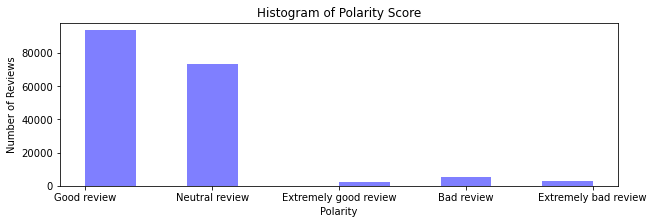

In [141]:
num_bins = 10
plt.figure(figsize=(10,3))
n, bins, patches = plt.hist(cleaned_data.sentiment, num_bins, facecolor='blue', alpha=0.5)
plt.xlabel('Polarity')
plt.ylabel('Number of Reviews')
plt.title('Histogram of Polarity Score')
plt.show();

In [142]:
cleaned_data['ratings ']=cleaned_data['ratings'].astype(float)
#cleaned_data=cleaned_data.rename(columns={'ratings ':'ratings'})

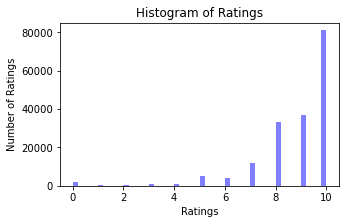

In [143]:
#Ratings distribution
num_bins = 50
plt.figure(figsize=(5,3))
n, bins, patches = plt.hist(cleaned_data.ratings, num_bins, facecolor='blue', alpha=0.5)
plt.xlabel('Ratings')
plt.ylabel('Number of Ratings')
plt.title('Histogram of Ratings')
plt.show();

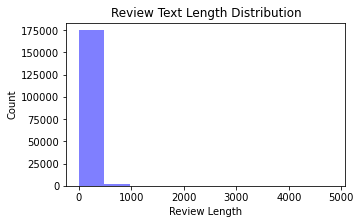

In [144]:
#Review text length
num_bins = 10
plt.figure(figsize=(5,3))
n, bins, patches = plt.hist(cleaned_data.review_len, num_bins, facecolor='blue', alpha=0.5)
plt.xlabel('Review Length')
plt.ylabel('Count')
plt.title('Review Text Length Distribution')
plt.show();

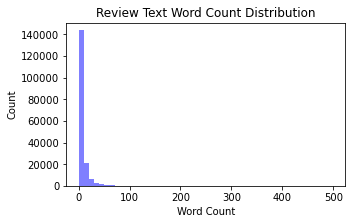

In [145]:
#Review Text Word Count Distribution
num_bins = 50
plt.figure(figsize=(5,3))
n, bins, patches = plt.hist(cleaned_data.word_count, num_bins, facecolor='blue', alpha=0.5)
plt.xlabel('Word Count')
plt.ylabel('Count')
plt.title('Review Text Word Count Distribution')
plt.show();


In [146]:
from sklearn.feature_extraction.text import CountVectorizer

In [148]:
#Distribution of top unigrams 
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(cleaned_data['comments_lemmatized'], 20)
for word, freq in common_words:
    print(word, freq)

good 105574
service 49422
product 39594
like 21740
time 20647
also 17340
everything 14519
customer 13522
will 13459
thing 13207
experience 13159
staff 12526
reason 11575
nice 10493
store 10216
give 10151
purchased 10130
person 10016
price 9606
actually 9527


#### Subjectivity
Subjectivity is used for individual sentences to determine whether a sentence expresses an opinion or not. In terms of subjectivity, textual information in the world can be broadly categorized into two main types: facts and opinions. Subjective sentences generally refer to personal opinion, emotion, or judgment whereas objective refers to factual information. Facts are objective expressions about entities, events, and properties. Opinions are usually subjective expressions that describe people’s sentiments, appraisals, or feelings toward entities, events, and their properties (Liu, 2010).

In sentiment analysis, subjectivity is also a float that lies in the range of [0,1]. When it is close to 0, it is more about facts. When subjectivity increases, it comes close to be an opinion. In the data set, the distribution of subjectivity scores for the reviews are similar to a normal distribution (Fig. 5). When we examined the relation between subjectivity, polarity, and Good Reviews features we can see that subjectivity and polarity shows a funneling pattern (Fig. 6). It can also be observed that low subjectivity score reviews are also neutral reviews in terms of polarity.

In [149]:
sub = lambda x: TextBlob(x).sentiment.subjectivity
cleaned_data['subjectivity'] = cleaned_data['comments_lemmatized'].apply(sub)

Text(0.5, 1.0, 'Distribution of Subjectivity Score')

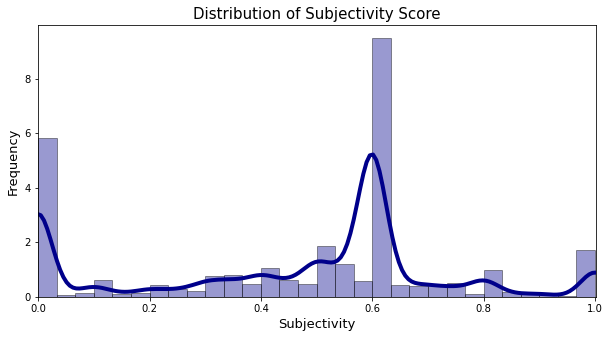

In [150]:
# Density Plot and Histogram of subjectivity
plt.figure(figsize=(10,5))
sns.distplot(cleaned_data['subjectivity'], hist=True, kde=True,
bins=int(30), color = 'darkblue',
hist_kws={'edgecolor':'black'},
kde_kws={'linewidth': 4})
plt.xlim([-0.001,1.001])
plt.xlabel('Subjectivity', fontsize=13)
plt.ylabel('Frequency', fontsize=13)
plt.title('Distribution of Subjectivity Score', fontsize=15)

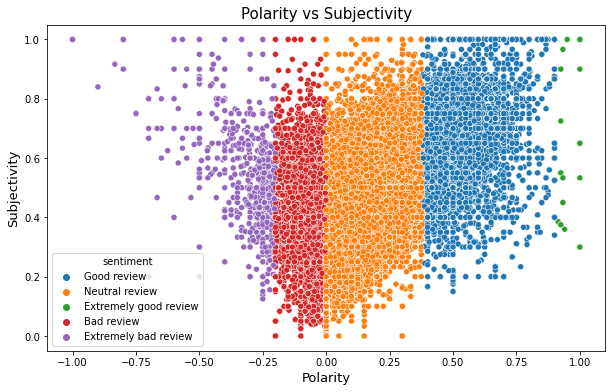

In [151]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='polarity', y='subjectivity', hue='sentiment', data=cleaned_data)
plt.xlabel('Polarity', fontsize=13)
plt.ylabel('Subjectivity', fontsize=13)
plt.title('Polarity vs Subjectivity', fontsize=15)
plt.show();

In [172]:
cleaned_data.describe()

,invoice_amt,ratings,polarity,review_len,word_count,ratings,subjectivity
count,1.766860e+05,176688.000000,176688.000000,176688.000000,176688.000000,176688.000000,176688.000000
mean,2.256758e+04,8.742773,0.380801,76.133201,7.637395,8.742773,0.457166
std,2.782235e+04,1.775959,0.314305,108.929930,11.022543,1.775959,0.285283
min,0.000000e+00,0.000000,-1.000000,2.000000,1.000000,0.000000,0.000000
25%,3.318088e+03,8.000000,0.000000,23.000000,2.000000,8.000000,0.250000
50%,1.501580e+04,9.000000,0.433333,45.000000,5.000000,9.000000,0.566667
75%,3.283741e+04,10.000000,0.700000,85.000000,8.000000,10.000000,0.600000
max,1.153172e+06,10.000000,1.000000,4838.000000,499.000000,10.000000,1.000000


In [174]:
#examine extreme reviews
cleaned_data.loc[(cleaned_data.polarity >0.38) & (cleaned_data.subjectivity <0.2), "comments"].tail(20)

34589     Because I have always got a best deal from croma and I'm a regular shopper at croma                                                                                                                                                                                                         
37637     overall that is the best  think I can give                                                                                                                                                                                                                                                  
38053     You get all such brands in the store so thats the best part multiple choices are there.                                                                                                                                                                                                     
47059     The financial process an the billing process was best.                                                   

In [153]:
a= cleaned_data.groupby(['category_desc']).sum()
res = a.apply(lambda x: x.sort_values(ascending=False).head(6))
res

,invoice_amt,ratings,polarity,review_len,word_count,ratings,subjectivity
Communication,1.534257e+09,532464,23596.483106,4133108,416632,532464.0,27622.855356
Computers Peripherals,6.933405e+08,225970,9647.284343,1995533,200093,225970.0,11739.693155
Entertainment,7.447119e+08,441189,19354.017013,3797041,380287,441189.0,23148.800582
Gaming,1.522551e+07,4522,191.459061,40874,4076,4522.0,239.324481
Large Appliances,8.286400e+08,197727,8417.521792,2192317,218981,197727.0,10556.525662
Small Appliances,1.478455e+08,133286,5671.516296,1208179,120862,133286.0,6979.554209


In [154]:
from chart_studio.plotly import plot, iplot
from plotly.offline import iplot

In [155]:
y0 = cleaned_data.loc[cleaned_data['category_desc'] == 'Communication']['subjectivity']
y1 = cleaned_data.loc[cleaned_data['category_desc'] == 'Large Appliances']['subjectivity']
y2 = cleaned_data.loc[cleaned_data['category_desc'] == 'Entertainment']['subjectivity']
y3 = cleaned_data.loc[cleaned_data['category_desc'] == 'Computers Peripherals']['subjectivity']
y4 = cleaned_data.loc[cleaned_data['category_desc'] == 'Gaming']['subjectivity']
y5 = cleaned_data.loc[cleaned_data['category_desc'] == 'Small Appliances']['subjectivity']

trace0 = go.Box(
    y=y0,
    name = 'Communication',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Large Appliances',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Entertainment',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'Computers Peripherals',
    marker = dict(
        color = 'rgb(12, 102, 14)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Gaming',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace5 = go.Box(
    y=y5,
    name = 'Small Appliances',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4, trace5]
layout = go.Layout(
    title = "Subjectivity Boxplot of Categories"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Subjectivity Boxplot of Categories")

In [156]:
y0 = cleaned_data.loc[cleaned_data['category_desc'] == 'Communication']['polarity']
y1 = cleaned_data.loc[cleaned_data['category_desc'] == 'Large Appliances']['polarity']
y2 = cleaned_data.loc[cleaned_data['category_desc'] == 'Entertainment']['polarity']
y3 = cleaned_data.loc[cleaned_data['category_desc'] == 'Computers Peripherals']['polarity']
y4 = cleaned_data.loc[cleaned_data['category_desc'] == 'Gaming']['polarity']
y5 = cleaned_data.loc[cleaned_data['category_desc'] == 'Small Appliances']['polarity']

trace0 = go.Box(
    y=y0,
    name = 'Communication',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Large Appliances',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Entertainment',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'Computers Peripherals',
    marker = dict(
        color = 'rgb(12, 102, 14)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Gaming',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace5 = go.Box(
    y=y5,
    name = 'Small Appliances',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4, trace5]
layout = go.Layout(
    title = "Polarity Boxplot of Categories"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Polarity Boxplot of Categories")

In [157]:
cleaned_data_crosstab = pd.crosstab(cleaned_data['NPS'], 
                            cleaned_data['sentiment'],  
                               margins = False)
                             
print(cleaned_data_crosstab) 

sentiment  Bad review  Extremely bad review  Extremely good review  \
NPS                                                                  
Detractor  1314        811                   34                      
Passive    2027        1137                  265                     
Promoter   1732        966                   1930                    

sentiment  Good review  Neutral review  
NPS                                     
Detractor  2992         8987            
Passive    18260        23194           
Promoter   72149        40890           


In [158]:
cleaned_data_crosstab = pd.crosstab(cleaned_data['NPS'], 
                            cleaned_data['sentiment'],  
                               normalize='columns')
                             
print(cleaned_data_crosstab) 

sentiment  Bad review  Extremely bad review  Extremely good review  \
NPS                                                                  
Detractor  0.259018    0.278312              0.015253                
Passive    0.399566    0.390185              0.118887                
Promoter   0.341415    0.331503              0.865859                

sentiment  Good review  Neutral review  
NPS                                     
Detractor  0.032034     0.122990        
Passive    0.195501     0.317417        
Promoter   0.772465     0.559593        


In [159]:
cleaned_data_crosstab = pd.crosstab(cleaned_data['NPS'], 
                            cleaned_data['sentiment'],  
                               normalize='index')
                             
print(cleaned_data_crosstab) 

sentiment  Bad review  Extremely bad review  Extremely good review  \
NPS                                                                  
Detractor  0.092941    0.057363              0.002405                
Passive    0.045162    0.025333              0.005904                
Promoter   0.014720    0.008210              0.016402                

sentiment  Good review  Neutral review  
NPS                                     
Detractor  0.211628     0.635663        
Passive    0.406836     0.516766        
Promoter   0.613163     0.347506        


In [71]:
cleaned_data_gr=cleaned_data[(cleaned_data['sentiment'] == 'Good reviews')]

In [72]:
cleaned_data_gr1 = " ".join(review for review in cleaned_data_gr.comments_lemmatized_clean)

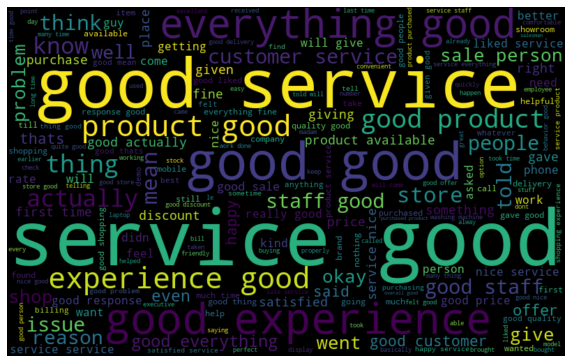

In [73]:
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(cleaned_data_gr1)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [74]:
cleaned_data_br=cleaned_data[(cleaned_data['sentiment'] == 'Bad reviews')]
cleaned_data_br1 = " ".join(review for review in cleaned_data_br.comments_lemmatized_clean)

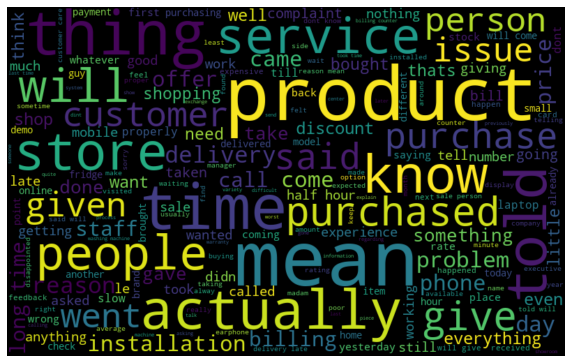

In [75]:
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(cleaned_data_br1)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [77]:
cleaned_data.to_csv('cleaned_data_modelling.csv', encoding = 'utf-8')

C:\Users\DELL\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



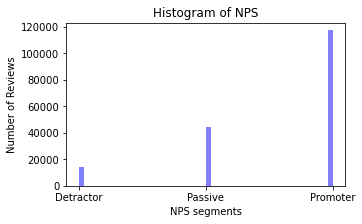

In [22]:
#Histogram of polarity distribution
num_bins = 50
plt.figure(figsize=(5,3))
n, bins, patches = plt.hist(cleaned_data_modelling.NPS, num_bins, facecolor='blue', alpha=0.5)
plt.xlabel('NPS segments')
plt.ylabel('Number of Reviews')
plt.title('Histogram of NPS')
plt.show();

# Topic Modelling 

#### (A) LSA

In [2]:
cleaned_data_modelling=pd.read_csv('cleaned_data_modelling.csv')

In [3]:
cleaned_data_modelling = cleaned_data_modelling.dropna(axis=0, subset=['comments_lemmatized_clean'])

In [95]:
# create document Term matrix

from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english', 
max_features= 1000, # keep top 1000 terms 
max_df = 0.5, 
smooth_idf=True)

X = vectorizer.fit_transform(cleaned_data_modelling['comments_lemmatized_clean'])

X.shape # check shape of the document-term matrix

(175961, 1000)

In [96]:
# Topic Modeling
from sklearn.decomposition import TruncatedSVD

# SVD represent documents and terms in vectors 
svd_model = TruncatedSVD(n_components=20, algorithm='randomized', n_iter=100, random_state=122)

svd_model.fit(X)

len(svd_model.components_)

20

In [97]:
terms = vectorizer.get_feature_names()

for i, comp in enumerate(svd_model.components_):
    terms_comp = zip(terms, comp)
    sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:7]
    print("Topic "+str(i)+": ")
    for t in sorted_terms:
        print(t[0])
        print(" ")

Topic 0: 
good
 
service
 
product
 
experience
 
staff
 
customer
 
like
 
Topic 1: 
service
 
like
 
nice
 
customer
 
liked
 
satisfied
 
happy
 
Topic 2: 
reason
 
product
 
like
 
nice
 
time
 
just
 
available
 
Topic 3: 
product
 
like
 
nice
 
time
 
available
 
experience
 
staff
 
Topic 4: 
experience
 
service
 
nice
 
shopping
 
like
 
overall
 
time
 
Topic 5: 
like
 
just
 
shopping
 
time
 
thing
 
good
 
shop
 
Topic 6: 
nice
 
like
 
staff
 
good
 
shopping
 
feel
 
time
 
Topic 7: 
time
 
delivery
 
shopping
 
customer
 
staff
 
billing
 
took
 
Topic 8: 
staff
 
helpful
 
liked
 
friendly
 
customer
 
experience
 
behavior
 
Topic 9: 
liked
 
shopping
 
thats
 
good
 
nice
 
year
 
felt
 
Topic 10: 
customer
 
price
 
liked
 
sale
 
thing
 
person
 
regular
 
Topic 11: 
shopping
 
customer
 
satisfied
 
product
 
happy
 
staff
 
year
 
Topic 12: 
price
 
discount
 
offer
 
thing
 
available
 
store
 
online
 
Topic 13: 
satisfied
 
issue
 
problem
 
sale
 
person
 
p

#### (B) LDA 


In [31]:
#pip install gensim

In [4]:
import gensim
from gensim.utils import simple_preprocess
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
import gensim, logging, warnings
import gensim.corpora as corpora
from gensim.utils import lemmatize, simple_preprocess
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt


In [6]:
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

def sent_to_words(sentences):
    for sentence in sentences:
        # deacc=True removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) 
             if word not in stop_words] for doc in texts]


data = cleaned_data_modelling.comments_lemmatized_clean.values.tolist()
data_words = list(sent_to_words(data))

# remove stop words
data_words = remove_stopwords(data_words)

print(data_words[:1][0][:30])

['happy', 'people', 'came', 'happy', 'time', 'feedback', 'given', 'communication', 'please', 'told', 'reason', 'given', 'feedback', 'problem', 'deal', 'walked', 'store', 'nobody', 'attended', 'fine', 'thing', 'self', 'later', 'told', 'many', 'people', 'standing', 'wasting', 'time', 'everybody']


In [7]:
import sys
# !{sys.executable} -m spacy download en
import re, numpy as np, pandas as pd
from pprint import pprint

In [8]:
id2word = corpora.Dictionary(data_words)

# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in data_words]

# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=6, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=10,
                                           passes=10,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True)

pprint(lda_model.print_topics())

[(0,
  '0.048*"purchased" + 0.038*"issue" + 0.038*"delivery" + 0.037*"give" + '
  '0.037*"done" + 0.036*"installation" + 0.020*"bought" + 0.019*"take" + '
  '0.019*"first" + 0.017*"liked"'),
 (1,
  '0.163*"product" + 0.104*"like" + 0.069*"experience" + 0.055*"customer" + '
  '0.043*"also" + 0.042*"actually" + 0.030*"thats" + 0.029*"mean" + '
  '0.018*"think" + 0.017*"shop"'),
 (2,
  '0.119*"staff" + 0.099*"person" + 0.082*"sale" + 0.075*"well" + 0.062*"know" '
  '+ 0.035*"explained" + 0.022*"helpful" + 0.017*"knowledge" + 0.015*"laptop" '
  '+ 0.015*"provided"'),
 (3,
  '0.067*"time" + 0.046*"thing" + 0.035*"reason" + 0.026*"available" + '
  '0.024*"store" + 0.023*"people" + 0.023*"given" + 0.023*"told" + '
  '0.021*"went" + 0.020*"problem"'),
 (4,
  '0.049*"gave" + 0.044*"much" + 0.043*"said" + 0.041*"offer" + 0.041*"nice" + '
  '0.038*"discount" + 0.030*"nothing" + 0.026*"right" + 0.024*"giving" + '
  '0.024*"le"'),
 (5,
  '0.412*"good" + 0.186*"service" + 0.056*"everything" + 0.031*

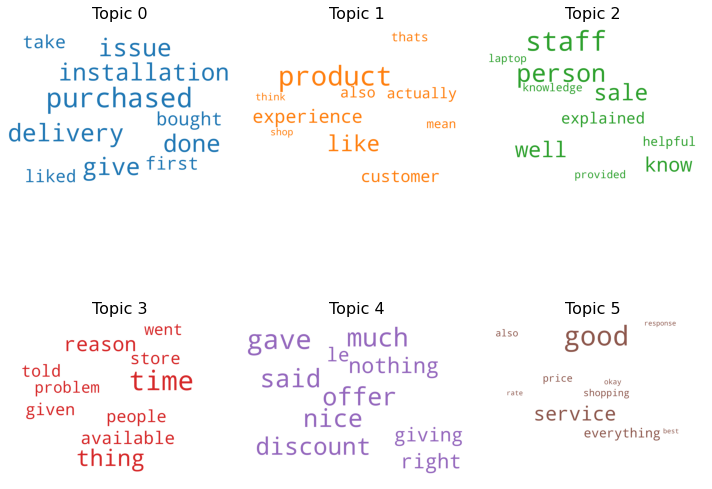

In [9]:
#from matplotlib import pyplot as  
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 3, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [10]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


In [11]:
df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_words)

In [108]:
# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head()

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,3.0,0.9248,"time, thing, reason, available, store, people,...","[happy, people, came, happy, time, feedback, g..."
1,1,5.0,0.4524,"good, service, everything, price, shopping, al...","[good, service, little, late, thing, good]"
2,2,3.0,0.4583,"time, thing, reason, available, store, people,...","[certain, iteam, place, ourchase, place, servi..."
3,3,5.0,0.4056,"good, service, everything, price, shopping, al...","[need, service, quicker, roming, entertain]"
4,4,5.0,0.7222,"good, service, everything, price, shopping, al...","[service, good]"


In [109]:
Dominant = pd.DataFrame(df_dominant_topic)

In [133]:
#most dominant topic 
Dominant.to_csv('topic_modelling.csv', encoding ='utf-8')

In [113]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.8958,"purchased, issue, delivery, give, done, installation, bought, take, first, liked","[bought, washing, machine, delivery, late, installation, late]"
1,1.0,0.8965,"product, like, experience, customer, also, actually, thats, mean, think, shop","[found, satisfactory, better, better, sense, product, selection, conviensing]"
2,2.0,0.8810,"staff, person, sale, well, know, explained, helpful, knowledge, laptop, provided","[sale, staff, explained, well, guided, well]"
3,3.0,0.9248,"time, thing, reason, available, store, people, given, told, went, problem","[happy, people, came, happy, time, feedback, given, communication, please, told, reason, given, ..."
4,4.0,0.9167,"gave, much, said, offer, nice, discount, nothing, right, giving, le","[discount, much, discount, gave, discount, gave, gave, much, discount]"
5,5.0,0.9164,"good, service, everything, price, shopping, also, okay, rate, response, best","[service, reliability, everything, good, conversion, also, good, executive, price, also, reasona..."


In [114]:
#the most discussed topics in the documents?
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)

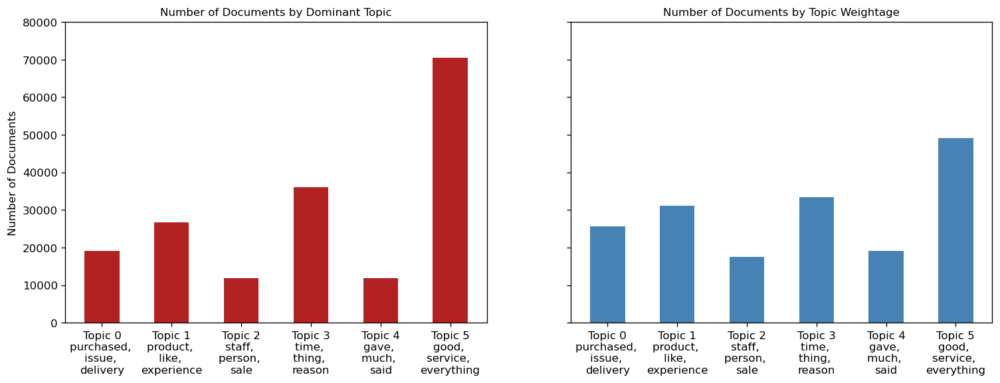

In [132]:
from matplotlib.ticker import FuncFormatter

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), dpi=120, sharey=True)

# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents', fontdict=dict(size=10))
ax1.set_ylim(0, 80000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

In [111]:
Dominant.groupby(['Dominant_Topic']).agg({'Topic_Perc_Contrib': 'count'})

,Topic_Perc_Contrib
Dominant_Topic,
0.0,19067
1.0,26756
2.0,11813
3.0,35994
4.0,11893
5.0,70438


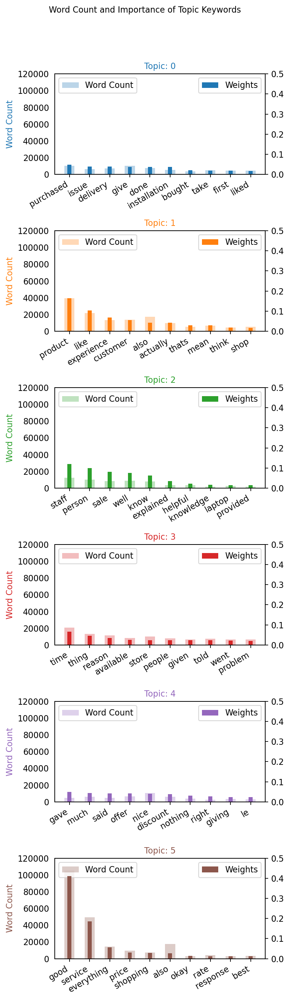

In [112]:
from collections import Counter
topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in data_words for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(6, 1, figsize=(5,16), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, .5); ax.set_ylim(0, 120000)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=10)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=10, y=1.05)    
plt.show()

In [16]:
cleaned_data_modelling.describe()

,Unnamed: 0,invoice_amt,ratings,polarity,review_len,word_count,ratings,subjectivity
count,176688.000000,1.766860e+05,176688.000000,176688.000000,176688.000000,176688.000000,176688.000000,176688.000000
mean,88343.500000,2.256758e+04,8.742773,0.380801,52.234538,7.637395,8.742773,0.457166
std,51005.576519,2.782235e+04,1.775959,0.314305,75.935548,11.022543,1.775959,0.285283
min,0.000000,0.000000e+00,0.000000,-1.000000,2.000000,1.000000,0.000000,0.000000
25%,44171.750000,3.318088e+03,8.000000,0.000000,15.000000,2.000000,8.000000,0.250000
50%,88343.500000,1.501580e+04,9.000000,0.433333,31.000000,5.000000,9.000000,0.566667
75%,132515.250000,3.283741e+04,10.000000,0.700000,59.000000,8.000000,10.000000,0.600000
max,176687.000000,1.153172e+06,10.000000,1.000000,3340.000000,499.000000,10.000000,1.000000


In [27]:
#examine extreme reviews
a= cleaned_data_modelling.loc[(cleaned_data_modelling.polarity <= 0) & (cleaned_data_modelling.subjectivity <=0), "comments"].tail(20)

In [28]:
pd.set_option('display.max_colwidth', -1)
print(a)

176569    driving                                                                                                                                                                                                          
176575    Because your salesman there mobile gave product having knowledge that like what there only that issue there rest take help from another person like asking something like this done someone only this issue there
176588    service should improved like there customer there should executives with that should improved                                                                                                                    
176593    visit times redeem vouchers they                                                                                                                                                                                 
176595    wish asked gave rating                                                                                        

### (c) KMeans

In [59]:
cleaned_data_modelling= pd.read_csv('cleaned_data_modelling.csv')

In [60]:
cleaned_data_modelling.head()

,Unnamed: 0,data_source,date,customer_contactno,customer_name,store_code,invoice_date,invoice_no,invoice_amt,brand_name,...,comments_no_sw,comments_lemmatized,comments_lemmatized_clean,NPS,polarity,review_len,word_count,sentiment,ratings,subjectivity
0,0,NPS - Store,2019-04-01,9822066109,SABNIS,A001,2019-03-30 00:00:00,SLA001010191262,26600.00,APPLE,...,"['happy', 'people', 'came', 'happy', 'time', '...",happy people came happy time feedback given co...,happy people came happy time feedback given co...,Detractor,0.503333,275,40,Good reviews,5.0,0.600000
1,1,NPS - Store,2019-04-01,7760619598,RAJESH .,A001,2019-03-30 00:00:00,SLA001010191284,7490.00,SAMSUNG,...,"['good', 'service', 'little', 'late', 'thing',...",good service little late thing good,good service little late thing good,Passive,0.228125,35,6,Good reviews,7.0,0.575000
2,2,NPS - Store,2019-04-01,9321224172,Rajendra Mehta,A001,2019-03-30 00:00:00,SLA001010191300,87720.75,HP,...,"['certain', 'iteam', 'place', 'ourchase', 'pla...",certain iteam place ourchase place service wis...,certain iteam place ourchase place service wis...,Passive,0.538095,52,8,Good reviews,8.0,0.690476
3,3,NPS - Store,2019-04-01,9930591702,ANAND KELUSKAR,A001,2019-03-30 00:00:00,SLA001010191304,1999.00,XIAOMI,...,"['need', 'service', 'quicker', 'roming', 'ente...",need service quicker roming entertain,need service quicker roming entertain,Passive,0.000000,37,5,Neutral,8.0,0.000000
4,4,NPS - Store,2019-04-01,9004008613,TAMANNE ALI SHAIKH,A002,2019-03-30 00:00:00,SAA002230000923,66900.00,SAMSUNG,...,"['service', 'good']",service good,service good,Passive,0.700000,12,2,Good reviews,8.0,0.600000


In [69]:
cleaned_data_modelling=cleaned_data_modelling.dropna() 

In [70]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import numpy as np
import pandas as pd

In [71]:
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(cleaned_data_modelling.comments_lemmatized)

In [90]:
true_k = 6
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=100, n_init=1)
model.fit(X)

KMeans(max_iter=100, n_clusters=6, n_init=1)

In [91]:
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()

In [92]:
for i in range(true_k):
    print('Cluster %d:' % i),
    for ind in order_centroids[i, :10]:
        print(' %s' % terms[ind])

Cluster 0:
 service
 good
 customer
 like
 liked
 staff
 time
 best
 satisfied
 fast
Cluster 1:
 good
 reason
 like
 time
 staff
 shopping
 thing
 price
 customer
 issue
Cluster 2:
 product
 good
 service
 available
 quality
 purchased
 like
 staff
 range
 time
Cluster 3:
 good
 service
 product
 staff
 response
 price
 quality
 people
 sale
 rate
Cluster 4:
 experience
 good
 shopping
 overall
 time
 great
 thats
 service
 like
 staff
Cluster 5:
 nice
 service
 experience
 feel
 good
 product
 staff
 shopping
 customer
 sale


### Understanding topics 

In [6]:
data_topic = pd.read_csv('relationship_data.csv')

In [8]:
data_topic.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'data_source', 'date',
       'customer_contactno', 'customer_name ', 'store_code', 'invoice_date ',
       'invoice_no ', 'invoice_amt', 'brand_name ', 'product_id',
       'product_name', 'class_desc', 'category_desc', 'ratings', 'comments',
       'comments_clean_tokenized', 'comments_no_sw', 'comments_lemmatized',
       'comments_lemmatized_clean', 'NPS', 'polarity', 'review_len',
       'word_count', 'sentiment', 'ratings ', 'subjectivity', 'Document_No',
       'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text'],
      dtype='object')

In [10]:
df=data_topic[['comments','Dominant_Topic','comments_lemmatized','Keywords']]

In [20]:
df0=df[(df['Dominant_Topic']==0)]
df1=df[(df['Dominant_Topic']==1)]
df2=df[(df['Dominant_Topic']==2)]
df3=df[(df['Dominant_Topic']==3)]
df4=df[(df['Dominant_Topic']==4)]
df5=df[(df['Dominant_Topic']==5)]

In [32]:
from sklearn.feature_extraction.text import CountVectorizer
#Distribution of top unigrams 
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(df4['comments_lemmatized'], 50)
for word, freq in common_words:
    print(word, freq)

good 7067
service 3295
product 2640
like 1464
time 1326
also 1131
everything 1031
customer 947
staff 884
thing 878
experience 870
will 842
reason 800
nice 699
purchased 686
give 680
price 672
store 669
actually 660
person 651
purchase 596
well 581
sale 548
told 530
people 521
available 521
done 519
shopping 501
just 474
mean 464
know 464
problem 452
delivery 449
issue 433
much 427
given 421
discount 417
come 407
offer 398
went 384
shop 371
thats 347
installation 342
phone 340
took 337
came 334
billing 328
take 328
mobile 323
want 318


# Establishing relationship between CSD-sentiments with cutsomer satisfaction 

### (A) Data preparation and pre-processing

In [2]:
topic_data = pd.read_csv('topic_modelling.csv')

In [3]:
topic_data.shape

(175961, 6)

In [4]:
cleaned_data_modelling=pd.read_csv('cleaned_data_modelling.csv')

In [5]:
cleaned_data_modelling.dropna(subset=['comments'], inplace=True)

In [100]:
cleaned_data_modelling.dropna(subset=['comments_lemmatized'], inplace=True)

In [101]:
cleaned_data_modelling.shape

(175961, 27)

In [102]:
cleaned_data_modelling.columns

Index(['Unnamed: 0', 'data_source', 'date', 'customer_contactno',
       'customer_name ', 'store_code', 'invoice_date ', 'invoice_no ',
       'invoice_amt', 'brand_name ', 'product_id', 'product_name',
       'class_desc', 'category_desc', 'ratings', 'comments',
       'comments_clean_tokenized', 'comments_no_sw', 'comments_lemmatized',
       'comments_lemmatized_clean', 'NPS', 'polarity', 'review_len',
       'word_count', 'sentiment', 'ratings ', 'subjectivity'],
      dtype='object')

In [103]:
relationship_data = pd.merge(cleaned_data_modelling, topic_data, how='inner', on='Unnamed: 0')

In [104]:
df=relationship_data[['Dominant_Topic','Topic_Perc_Contrib','comments','sentiment','ratings','NPS']]
df0=df[(df['Dominant_Topic']==0)]
df1=df[(df['Dominant_Topic']==1)]
df2=df[(df['Dominant_Topic']==2)]
df3=df[(df['Dominant_Topic']==3)]
df4=df[(df['Dominant_Topic']==4)]
df5=df[(df['Dominant_Topic']==5)]

In [105]:
df0.to_csv('generic.csv', encoding='utf-8')
df1.to_csv('product.csv', encoding='utf-8')
df2.to_csv('experience.csv', encoding='utf-8')
df3.to_csv('availability.csv', encoding='utf-8')
df4.to_csv('discount.csv', encoding='utf-8')
df5.to_csv('service.csv', encoding='utf-8')

In [198]:
relationship_data.to_csv('relationship_data.csv', encoding='utf-8')

In [239]:
relationship_data=pd.read_csv('relationship_data.csv')

In [44]:
relationship_data.loc[(relationship_data.polarity >=0.2), "sentiment"] = "positive review"
relationship_data.loc[(relationship_data.polarity <0.2), "sentiment"] = "negative review"

In [45]:
relationship_data.sentiment.unique()

array(['positive review', 'negative review'], dtype=object)

In [46]:
relationship_data= relationship_data.drop(['data_source', 'date', 'customer_contactno',
       'customer_name ', 'store_code', 'invoice_date ', 'invoice_no ',
       'invoice_amt', 'brand_name ', 'product_id', 'product_name',
       'class_desc', 'category_desc','comments',
       'comments_clean_tokenized', 'comments_no_sw', 'comments_lemmatized',
       'comments_lemmatized_clean','polarity', 'review_len',
       'word_count','ratings ', 'subjectivity','Keywords', 'Text','Unnamed: 0','Topic_Perc_Contrib','Document_No'], axis = 1)

In [47]:
#relationship_data= relationship_data.drop(['Unnamed: 0.1'], axis = 1)

In [48]:
relationship_data.columns

Index(['ratings', 'NPS', 'sentiment', 'Dominant_Topic'], dtype='object')

In [49]:
relationship_data.head()

,ratings,NPS,sentiment,Dominant_Topic
0,5,Detractor,positive review,3.0
1,7,Passive,positive review,5.0
2,8,Passive,positive review,3.0
3,8,Passive,negative review,5.0
4,8,Passive,positive review,5.0


In [50]:
relationship_data.loc[relationship_data.Dominant_Topic == 0, "CSD"] = "Generic"
relationship_data.loc[relationship_data.Dominant_Topic == 1, "CSD"] = "Product"
relationship_data.loc[relationship_data.Dominant_Topic == 2, "CSD"] = "Experience"
relationship_data.loc[relationship_data.Dominant_Topic == 3, "CSD"] = "Availability"
relationship_data.loc[relationship_data.Dominant_Topic == 4, "CSD"] = "Discount"
relationship_data.loc[relationship_data.Dominant_Topic == 5, "CSD"] = "Service"

In [51]:
relationship_data= relationship_data.drop(['Dominant_Topic'], axis = 1)

In [52]:
relationship_data= relationship_data.drop(['ratings'], axis = 1)

In [53]:
relationship_data.loc[(relationship_data.CSD == 'Generic') & (relationship_data.sentiment =='positive review'), "Generic+ve"] = 1
relationship_data.loc[(relationship_data.CSD == 'Generic') & (relationship_data.sentiment =='negative review'), "Generic-ve"] = 1
relationship_data.loc[(relationship_data.CSD == 'Product') & (relationship_data.sentiment =='positive review'), "Product+ve"] = 1
relationship_data.loc[(relationship_data.CSD == 'Product') & (relationship_data.sentiment =='negative review'), "Product-ve"] = 1
relationship_data.loc[(relationship_data.CSD == 'Experience') & (relationship_data.sentiment =='positive review'), "Experience+ve"] = 1
relationship_data.loc[(relationship_data.CSD == 'Experience') & (relationship_data.sentiment =='negative review'), "Experience-ve"] = 1
relationship_data.loc[(relationship_data.CSD == 'Availability') & (relationship_data.sentiment =='positive review'), "Availability+ve"] = 1
relationship_data.loc[(relationship_data.CSD == 'Availability') & (relationship_data.sentiment =='negative review'), "Availability-ve"] = 1
relationship_data.loc[(relationship_data.CSD == 'Discount') & (relationship_data.sentiment =='positive review'), "Discount+ve"] = 1
relationship_data.loc[(relationship_data.CSD == 'Discount') & (relationship_data.sentiment =='negative review'), "Discount-ve"] = 1
relationship_data.loc[(relationship_data.CSD == 'Service') & (relationship_data.sentiment =='positive review'), "Service+ve"] = 1
relationship_data.loc[(relationship_data.CSD == 'Service') & (relationship_data.sentiment =='negative review'), "Service-ve"] = 1

In [54]:
relationship_data=relationship_data.replace(np.nan, 0)

In [55]:
relationship_data.head()

,NPS,sentiment,CSD,Generic+ve,Generic-ve,Product+ve,Product-ve,Experience+ve,Experience-ve,Availability+ve,Availability-ve,Discount+ve,Discount-ve,Service+ve,Service-ve
0,Detractor,positive review,Availability,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,Passive,positive review,Service,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,Passive,positive review,Availability,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,Passive,negative review,Service,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,Passive,positive review,Service,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [56]:
relationship_data.groupby('CSD').count()

,NPS,sentiment,Generic+ve,Generic-ve,Product+ve,Product-ve,Experience+ve,Experience-ve,Availability+ve,Availability-ve,Discount+ve,Discount-ve,Service+ve,Service-ve
CSD,,,,,,,,,,,,,,
Availability,35849,35849,35849,35849,35849,35849,35849,35849,35849,35849,35849,35849,35849,35849
Discount,11847,11847,11847,11847,11847,11847,11847,11847,11847,11847,11847,11847,11847,11847
Experience,11769,11769,11769,11769,11769,11769,11769,11769,11769,11769,11769,11769,11769,11769
Generic,18985,18985,18985,18985,18985,18985,18985,18985,18985,18985,18985,18985,18985,18985
Product,26650,26650,26650,26650,26650,26650,26650,26650,26650,26650,26650,26650,26650,26650
Service,70135,70135,70135,70135,70135,70135,70135,70135,70135,70135,70135,70135,70135,70135


In [57]:
relationship_data=relationship_data.drop(['sentiment','CSD'], axis=1)

In [58]:
relationship_data.head()

,NPS,Generic+ve,Generic-ve,Product+ve,Product-ve,Experience+ve,Experience-ve,Availability+ve,Availability-ve,Discount+ve,Discount-ve,Service+ve,Service-ve
0,Detractor,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,Passive,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,Passive,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,Passive,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,Passive,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [59]:
relationship_data.loc[relationship_data.NPS == 'Detractor', "output"] = 0
relationship_data.loc[relationship_data.NPS == 'Passive', "output"] = 1
relationship_data.loc[relationship_data.NPS == 'Promoter', "output"] = 2

In [60]:
relationship_data=relationship_data.drop(['NPS'], axis=1)

In [61]:
relationship_data_final = relationship_data

In [267]:
relationship_data_final.to_csv('relationship_data_final.csv', encoding='utf-8')

### (B) Model Building 
#### (1) Decision tree classifier

In [6]:
relationship_data_final=pd.read_csv('relationship_data_final.csv')

In [7]:
relationship_data_final=relationship_data_final.drop(['Unnamed: 0'],axis=1)

In [62]:
relationship_data_final.columns

Index(['Generic+ve', 'Generic-ve', 'Product+ve', 'Product-ve', 'Experience+ve',
       'Experience-ve', 'Availability+ve', 'Availability-ve', 'Discount+ve',
       'Discount-ve', 'Service+ve', 'Service-ve', 'output'],
      dtype='object')

In [63]:
relationship_data_final.head()

,Generic+ve,Generic-ve,Product+ve,Product-ve,Experience+ve,Experience-ve,Availability+ve,Availability-ve,Discount+ve,Discount-ve,Service+ve,Service-ve,output
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


In [64]:
relationship_data_final.columns

Index(['Generic+ve', 'Generic-ve', 'Product+ve', 'Product-ve', 'Experience+ve',
       'Experience-ve', 'Availability+ve', 'Availability-ve', 'Discount+ve',
       'Discount-ve', 'Service+ve', 'Service-ve', 'output'],
      dtype='object')

In [66]:
X = relationship_data_final[['Generic+ve', 'Generic-ve', 'Product+ve', 'Product-ve', 'Experience+ve',
       'Experience-ve', 'Availability+ve', 'Availability-ve', 'Discount+ve',
       'Discount-ve', 'Service+ve', 'Service-ve']]

In [67]:
Y = relationship_data_final[['output']]

In [68]:
from sklearn.model_selection import train_test_split

In [69]:
X_train, X_test, y_train, y_test = train_test_split( X, Y, test_size = 0.2, random_state = 42)

In [70]:
print(X_train.shape)
print(X_test.shape)

(140188, 12)
(35047, 12)


In [71]:
y = Y

In [72]:
# Defining the decision tree algorithm
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier#for checking testing results
dtree=DecisionTreeClassifier()
dtree.fit(X_train,y_train)
print('Decision Tree Classifier Created')

Decision Tree Classifier Created


In [73]:
from sklearn.metrics import classification_report, confusion_matrix#for visualizing tree 
from sklearn.tree import plot_tree
y_pred = dtree.predict(X_test)
print("Classification report - \n", classification_report(y_test,y_pred))

Classification report - 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      2744
         1.0       0.00      0.00      0.00      8954
         2.0       0.67      1.00      0.80     23349

    accuracy                           0.67     35047
   macro avg       0.22      0.33      0.27     35047
weighted avg       0.44      0.67      0.53     35047



In [74]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [75]:
def draw_cm( actual, predicted ):
    plt.figure(figsize=(5,5))
    cm = metrics.confusion_matrix( actual, predicted )
    sns.heatmap(cm, annot=True,  fmt='.0f', xticklabels = ["Detractor", "Passive",'Promoter'] , 
               yticklabels = ["Detractor", "Passive",'Promoter'],cmap = 'Pastel2_r')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Classification Matrix Plot', size = 15);
    plt.show()

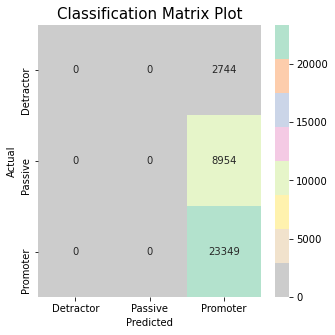

In [76]:
draw_cm(y_test, y_pred)

In [77]:
cart_reg_report = (classification_report(y_test, y_pred))
print(cart_reg_report)

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      2744
         1.0       0.00      0.00      0.00      8954
         2.0       0.67      1.00      0.80     23349

    accuracy                           0.67     35047
   macro avg       0.22      0.33      0.27     35047
weighted avg       0.44      0.67      0.53     35047



In [78]:
# Visualising the graph without the use of graphviz
#plt.figure(figsize = (30,30))
#dec_tree = plot_tree(decision_tree=dtree, feature_names = relationship_data_final.columns, 
                     #class_names =["setosa", "vercicolor", "verginica"] , filled = True , precision = 4, rounded = True)

Feature: 0, Score: 0.00009
Feature: 1, Score: 0.11873
Feature: 2, Score: 0.00001
Feature: 3, Score: 0.17928
Feature: 4, Score: 0.00040
Feature: 5, Score: 0.09382
Feature: 6, Score: 0.00018
Feature: 7, Score: 0.20347
Feature: 8, Score: 0.00002
Feature: 9, Score: 0.08808
Feature: 10, Score: 0.00000
Feature: 11, Score: 0.31590


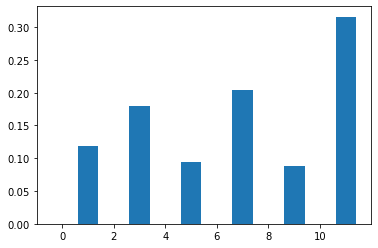

In [91]:
from matplotlib import pyplot
importance = dtree.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [80]:
relationship_data_final.columns

Index(['Generic+ve', 'Generic-ve', 'Product+ve', 'Product-ve', 'Experience+ve',
       'Experience-ve', 'Availability+ve', 'Availability-ve', 'Discount+ve',
       'Discount-ve', 'Service+ve', 'Service-ve', 'output'],
      dtype='object')

#### (2) Random Forest classifier 

Feature: 0, Score: 0.04356
Feature: 1, Score: 0.06807
Feature: 2, Score: 0.05945
Feature: 3, Score: 0.10670
Feature: 4, Score: 0.03305
Feature: 5, Score: 0.05150
Feature: 6, Score: 0.05120
Feature: 7, Score: 0.14600
Feature: 8, Score: 0.02931
Feature: 9, Score: 0.04457
Feature: 10, Score: 0.09720
Feature: 11, Score: 0.26939


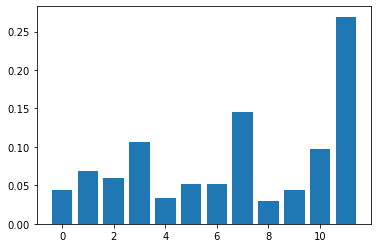

In [92]:
# random forest for feature importance on a classification problem
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier

# random forest for feature importance on a classification problem
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from matplotlib import pyplot
# define the model
model = RandomForestClassifier()
# fit the model
model.fit(X_train,y_train)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [93]:
y_pred = model.predict(X_test)
print("Classification report - \n", classification_report(y_test,y_pred))

Classification report - 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      2744
         1.0       0.00      0.00      0.00      8954
         2.0       0.67      1.00      0.80     23349

    accuracy                           0.67     35047
   macro avg       0.22      0.33      0.27     35047
weighted avg       0.44      0.67      0.53     35047



In [94]:
def draw_cm( actual, predicted ):
    plt.figure(figsize=(5,5))
    cm = metrics.confusion_matrix( actual, predicted )
    sns.heatmap(cm, annot=True,  fmt='.0f', xticklabels = ["Detractor", "Passive",'Promoter'] , 
               yticklabels = ["Detractor", "Passive",'Promoter'],cmap = 'Pastel2_r')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Classification Matrix Plot', size = 15);
    plt.show()

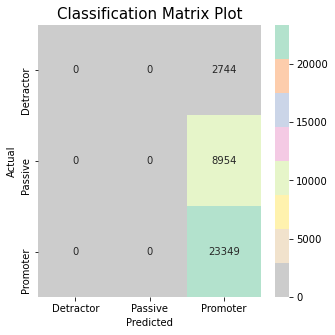

In [95]:
draw_cm(y_test, y_pred)

#### (3) XGBoost classifier 

In [85]:
#pip install xgboost

In [86]:
from sklearn.datasets import make_classification
from xgboost import XGBClassifier
from matplotlib import pyplot

[22:15:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Feature: 0, Score: 0.00216
Feature: 1, Score: 0.14739
Feature: 2, Score: 0.00227
Feature: 3, Score: 0.15901
Feature: 4, Score: 0.00244
Feature: 5, Score: 0.08461
Feature: 6, Score: 0.00224
Feature: 7, Score: 0.17518
Feature: 8, Score: 0.00138
Feature: 9, Score: 0.08425
Feature: 10, Score: 0.00351
Feature: 11, Score: 0.33555


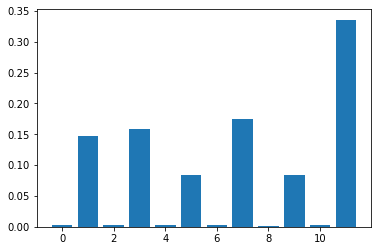

In [87]:
# define the model
model = XGBClassifier()
# fit the model
model.fit(X_train,y_train)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [88]:
y_pred = model.predict(X_test)
print("Classification report - \n", classification_report(y_test,y_pred))

Classification report - 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      2744
         1.0       0.00      0.00      0.00      8954
         2.0       0.67      1.00      0.80     23349

    accuracy                           0.67     35047
   macro avg       0.22      0.33      0.27     35047
weighted avg       0.44      0.67      0.53     35047



In [89]:
def draw_cm( actual, predicted ):
    plt.figure(figsize=(5,5))
    cm = metrics.confusion_matrix( actual, predicted )
    sns.heatmap(cm, annot=True,  fmt='.0f', xticklabels = ["Detractor", "Passive",'Promoter'] , 
               yticklabels = ["Detractor", "Passive",'Promoter'],cmap = 'Pastel2_r')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Classification Matrix Plot', size = 15);
    plt.show()

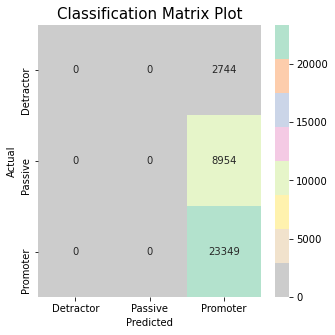

In [90]:
draw_cm(y_test, y_pred)

#### (4) SVM 

In [421]:
from sklearn.svm import LinearSVC
from sklearn.metrics import confusion_matrix

In [422]:
svc = LinearSVC()
svc.fit(X_train, y_train)

LinearSVC()

In [425]:
y_pred = svc.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[    0,   413,  2331],
       [    0,   603,  8351],
       [    0,   523, 22826]], dtype=int64)

In [426]:
y_pred = svc.predict(X_test)
print("Classification report - \n", classification_report(y_test,y_pred))

Classification report - 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      2744
         1.0       0.39      0.07      0.11      8954
         2.0       0.68      0.98      0.80     23349

    accuracy                           0.67     35047
   macro avg       0.36      0.35      0.31     35047
weighted avg       0.55      0.67      0.56     35047



#### (5) Ensemble method

##### Max Voting

In [579]:
from sklearn.ensemble import VotingClassifier
model1 = DecisionTreeClassifier()
model2 = RandomForestClassifier()
model3 = XGBClassifier()
model4 = LinearSVC()

model = VotingClassifier(estimators=[('cart', model1), ('rf', model2), ('xgb', model3), ('svc', model4)], voting='hard')

model.fit(X_train,y_train)
model.score(X_test,y_test)

[17:41:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


0.6685022969155705

In [580]:
y_pred = model.predict(X_test)
print("Classification report - \n", classification_report(y_test,y_pred))

Classification report - 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      2744
         1.0       0.39      0.07      0.11      8954
         2.0       0.68      0.98      0.80     23349

    accuracy                           0.67     35047
   macro avg       0.36      0.35      0.31     35047
weighted avg       0.55      0.67      0.56     35047



In [581]:
def draw_cm( actual, predicted ):
    plt.figure(figsize=(5,5))
    cm = metrics.confusion_matrix( actual, predicted )
    sns.heatmap(cm, annot=True,  fmt='.0f', xticklabels = ["Detractor", "Passive",'Promoter'] , 
               yticklabels = ["Detractor", "Passive",'Promoter'],cmap = 'Pastel2_r')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Classification Matrix Plot', size = 15);
    plt.show()

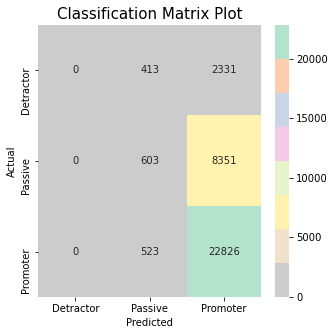

In [582]:
draw_cm(y_test, y_pred)

#### Average method

In [593]:
model_soft = VotingClassifier(estimators=[('cart', model1), ('rf', model2), ('xgb', model3)], voting='hard',weights=[1,5,1], flatten_transform=True)

model_soft.fit(X_train,y_train)
model_soft.score(X_test,y_test)

[17:59:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


0.6685022969155705

In [590]:
y_pred = model_soft.predict(X_test)
print("Classification report - \n", classification_report(y_test,y_pred))

Classification report - 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      2744
         1.0       0.39      0.07      0.11      8954
         2.0       0.68      0.98      0.80     23349

    accuracy                           0.67     35047
   macro avg       0.36      0.35      0.31     35047
weighted avg       0.55      0.67      0.56     35047



In [591]:
def draw_cm( actual, predicted ):
    plt.figure(figsize=(5,5))
    cm = metrics.confusion_matrix( actual, predicted )
    sns.heatmap(cm, annot=True,  fmt='.0f', xticklabels = ["Detractor", "Passive",'Promoter'] , 
               yticklabels = ["Detractor", "Passive",'Promoter'],cmap = 'Pastel2_r')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Classification Matrix Plot', size = 15);
    plt.show()

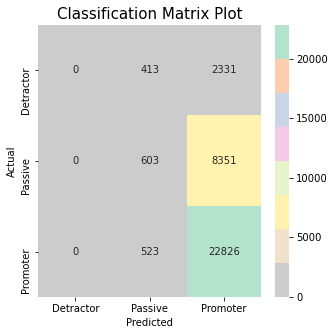

In [592]:
draw_cm(y_test, y_pred)

#### (6) Random Forest with SMOTE 

In [71]:
relationship_data_final.head()

,generic_good,generic_nuetral,generic_extremelygood,generic_bad,generic_extremelybad,product_good,product_nuetral,product_extremelygood,product_bad,product_extremelybad,...,discount_nuetral,discount_extremelygood,discount_bad,discount_extremelybad,service_good,service_nuetral,service_extremelygood,service_bad,service_extremelybad,output
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [52]:
#pip install imblearn

In [53]:
#pip install imblearn -U

In [54]:
#pip update scikit-learn

In [55]:
#pip install imbalanced-learn==0.7.0

In [72]:
from imblearn.over_sampling import SMOTE 
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

In [74]:
y_train.groupby(['output']).size().reset_index(name='counts')

,output,counts
0,0.0,11270
1,1.0,35420
2,2.0,93498


In [140]:
# define pipeline
strategy_over = {0:60000, 1:70000, 2:94000}
#strategy_under = {0:11270, 1:35420, 2:93498}
over = SMOTE(sampling_strategy=strategy_over)
#under = RandomUnderSampler(sampling_strategy=strategy_under)
#steps = [('o', over), ('u', under)]
#pipeline = Pipeline(steps=steps)
# transform the dataset
X, y = over.fit_resample(X_train, y_train)

In [141]:
print(X.shape)
print(y.shape)

(224000, 30)
(224000, 1)


In [142]:
y.groupby(['output']).size().reset_index(name='counts')

,output,counts
0,0.0,60000
1,1.0,70000
2,2.0,94000


In [143]:
# random forest for feature importance on a classification problem
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix#for visualizing tree 

# random forest for feature importance on a classification problem
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from matplotlib import pyplot
model = RandomForestClassifier()
# fit the model
model.fit(X,y)
y_pred = model.predict(X_test)
print("Classification report - \n", classification_report(y_test,y_pred))

Classification report - 
               precision    recall  f1-score   support

         0.0       0.14      0.72      0.23      2744
         1.0       0.32      0.05      0.09      8954
         2.0       0.77      0.63      0.69     23349

    accuracy                           0.49     35047
   macro avg       0.41      0.47      0.34     35047
weighted avg       0.61      0.49      0.50     35047



In [144]:
import sklearn.metrics as metrics
def draw_cm( actual, predicted ):
    plt.figure(figsize=(5,5))
    cm = metrics.confusion_matrix( actual, predicted )
    sns.heatmap(cm, annot=True,  fmt='.0f', xticklabels = ["Detractor", "Passive",'Promoter'] , 
               yticklabels = ["Detractor", "Passive",'Promoter'],cmap = 'Pastel2_r')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Classification Matrix Plot', size = 15);
    plt.show()

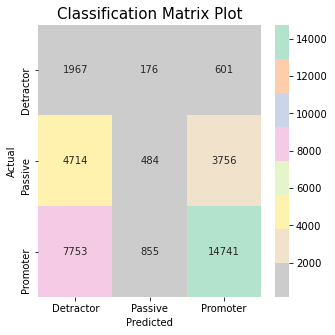

In [145]:
draw_cm(y_test, y_pred)

Feature: 0, Score: 0.06922
Feature: 1, Score: 0.01523
Feature: 2, Score: 0.00749
Feature: 3, Score: 0.01033
Feature: 4, Score: 0.01098
Feature: 5, Score: 0.09375
Feature: 6, Score: 0.03237
Feature: 7, Score: 0.00875
Feature: 8, Score: 0.01599
Feature: 9, Score: 0.01100
Feature: 10, Score: 0.05617
Feature: 11, Score: 0.01263
Feature: 12, Score: 0.00423
Feature: 13, Score: 0.00912
Feature: 14, Score: 0.00468
Feature: 15, Score: 0.10779
Feature: 16, Score: 0.03455
Feature: 17, Score: 0.01094
Feature: 18, Score: 0.02697
Feature: 19, Score: 0.01669
Feature: 20, Score: 0.05246
Feature: 21, Score: 0.01193
Feature: 22, Score: 0.00518
Feature: 23, Score: 0.00968
Feature: 24, Score: 0.00243
Feature: 25, Score: 0.19012
Feature: 26, Score: 0.06506
Feature: 27, Score: 0.01732
Feature: 28, Score: 0.05660
Feature: 29, Score: 0.03034


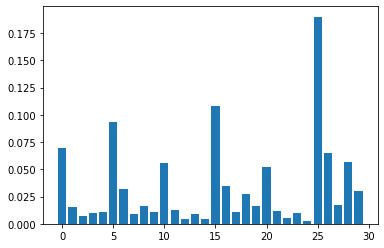

In [146]:
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()